In [1]:
# Package for data science
import pandas as pd
import numpy as np

# Package for visualisation
import matplotlib.pyplot as plt
import seaborn as sns

# Packages for machine learning
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import StackingRegressor

# Others
import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv('Bass_BigTable.csv')
data

,Price,Id,Size,Format,City,Impression,B01001001,B01001002,B01001003,B01001004,...,serviceRoad,trackRoad,footwayRoad,pathRoad,traffic_signals,aggr_residential_zone,aggr_commercial_zone,aggr_natural_zone,BFP_Count,BFP_Area
0,700,1,44.6,Individual,Lacassine LA,68992,5384,2919,213,152,...,43,5,4,0,0,2,1,29,22,694.83
1,700,2,44.6,Individual,Lacassine LA,68992,5384,2919,213,152,...,52,3,17,0,0,3,1,30,12,486.00
2,700,3,44.6,Stacked,Lacassine LA,68992,4641,2198,174,162,...,183,10,1,0,0,1,0,42,38,919.75
3,700,4,44.6,Individual,Baldwin LA,24379,1534,876,6,0,...,66,2,0,0,0,0,0,21,125,1430.83
4,825,6,44.6,Individual,Lacassine LA,68992,5384,2919,213,152,...,43,5,4,0,0,2,1,29,22,694.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,700,85,44.6,Individual,Broussard LA,47152,4155,2139,130,281,...,196,4,29,0,1,10,1,33,23,4313.40
69,700,86,44.6,Individual,Broussard LA,44507,3447,1778,108,43,...,175,2,18,0,0,4,0,16,131,3833.17
70,700,87,44.6,Individual,Broussard LA,44507,3420,1759,120,48,...,175,2,18,0,0,4,0,16,115,3833.17
71,700,89,44.6,Individual,New Iberia LA,32202,3823,1878,93,313,...,599,3,196,18,0,18,30,36,34,5431.19


In [3]:
data.describe()

,Price,Id,Size,Impression,B01001001,B01001002,B01001003,B01001004,B01001005,B01001006,...,serviceRoad,trackRoad,footwayRoad,pathRoad,traffic_signals,aggr_residential_zone,aggr_commercial_zone,aggr_natural_zone,BFP_Count,BFP_Area
count,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,...,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000
mean,744.863014,44.041096,44.023288,52035.849315,3711.246575,1858.424658,126.150685,166.589041,133.328767,72.219178,...,249.808219,4.000000,52.835616,3.383562,1.657534,8.273973,5.780822,25.726027,61.561644,4530.302192
std,154.389417,26.299260,8.867098,21407.470588,1222.877410,625.578220,71.374145,100.748013,94.785438,40.853820,...,211.039271,4.893306,69.821203,6.516283,4.773245,7.213529,10.495034,20.904053,75.915704,6159.827161
min,500.000000,1.000000,32.500000,3586.000000,1012.000000,511.000000,0.000000,0.000000,6.000000,0.000000,...,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000,217.610000
25%,700.000000,21.000000,44.600000,36502.000000,3146.000000,1556.000000,79.000000,74.000000,64.000000,44.000000,...,76.000000,2.000000,3.000000,0.000000,0.000000,2.000000,0.000000,15.000000,20.000000,1211.610000
50%,700.000000,43.000000,44.600000,47980.000000,3623.000000,1877.000000,114.000000,152.000000,108.000000,64.000000,...,176.000000,3.000000,29.000000,0.000000,0.000000,7.000000,1.000000,23.000000,34.000000,2220.580000
75%,800.000000,66.000000,44.600000,68992.000000,4625.000000,2157.000000,173.000000,274.000000,169.000000,87.000000,...,415.000000,5.000000,60.000000,0.000000,1.000000,14.000000,1.000000,33.000000,72.000000,4313.400000
max,1500.000000,90.000000,111.500000,109883.000000,6494.000000,3017.000000,302.000000,342.000000,425.000000,208.000000,...,779.000000,38.000000,264.000000,18.000000,25.000000,27.000000,33.000000,159.000000,419.000000,36835.790000


## Deploying Klib Library
klib is a Python library for importing, cleaning, analyzing and preprocessing data. Future versions will include model creation and optimization to provide an end-to-end solution.

In [4]:
%pip install klib

Note: you may need to restart the kernel to use updated packages.


### Missing Value Plot
This plot visualizes the missing values in a dataset. At the top it shows the aggregate for each column using a relative scale and absolute missing-value annotations, while on the right, summary statistics and individual row results are displayed. Using this plot allows to gain a quick overview over the structure of missing values and their relation in a dataset and easily determine which columns and rows to investigate / drop.

In [5]:
import klib
klib.missingval_plot(data) # default representation of missing values, other settings such as sorting are available

No missing values found in the dataset.


### Data Cleaning
This is achieved by dropping empty and single valued columns as well as empty and duplicate rows (neither found in this example). Additionally, the optimal data types are inferred and applied, which also increases memory efficiency. This kind of reduction is not uncommon. For larger datasets the reduction in size often surpasses 90%.

In [6]:
data_cleaned = klib.data_cleaning(data)

Shape of cleaned data: (73, 403) - Remaining NAs: 0


Dropped rows: 0
     of which 0 duplicates. (Rows (first 150 shown): [])

Dropped columns: 5
     of which 5 single valued.     Columns: ['b14004004', 'b14004009', 'b14004025', 'b14004009_1', 'b14004025_1']
Dropped missing values: 0
Reduced memory by at least: 0.18 MB (-78.26%)



### Correlation Plots
This plot visualizes the correlation between different features. Settings include the possibility to only display positive, negative, high or low correlations as well as specify an additional threshold.

<Axes: title={'center': 'Feature-correlation (pearson)'}>

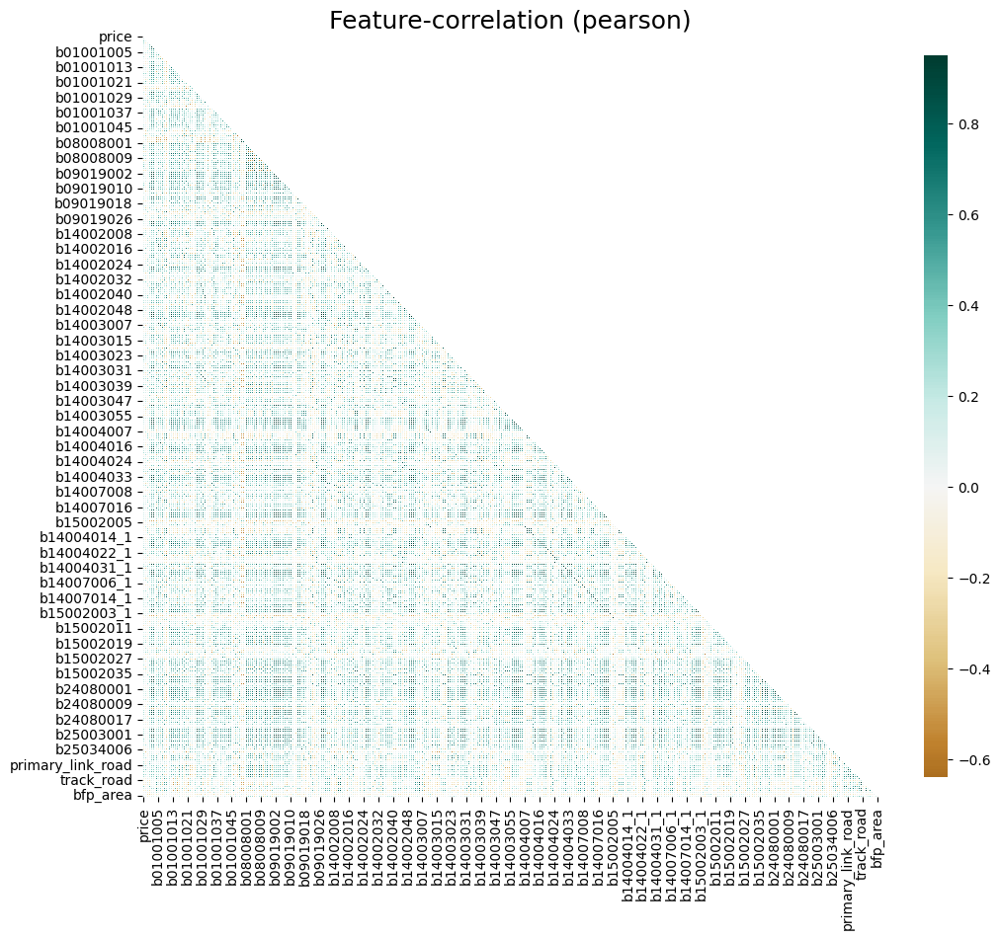

In [7]:
klib.corr_plot(data_cleaned,annot=False)

Displaying positive correlations. Specify a positive "threshold" to limit the results further.
Displaying negative correlations. Specify a negative "threshold" to limit the results further.


<Axes: title={'center': 'Feature-correlation (pearson)'}>

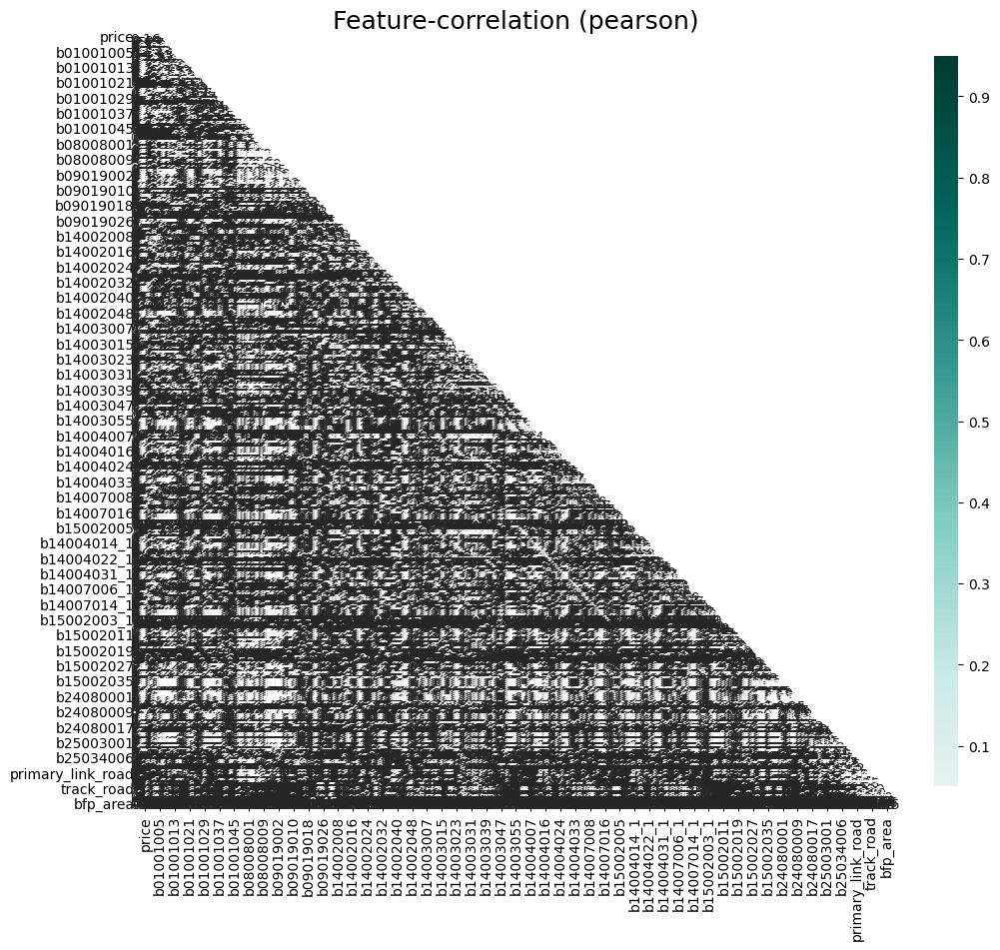

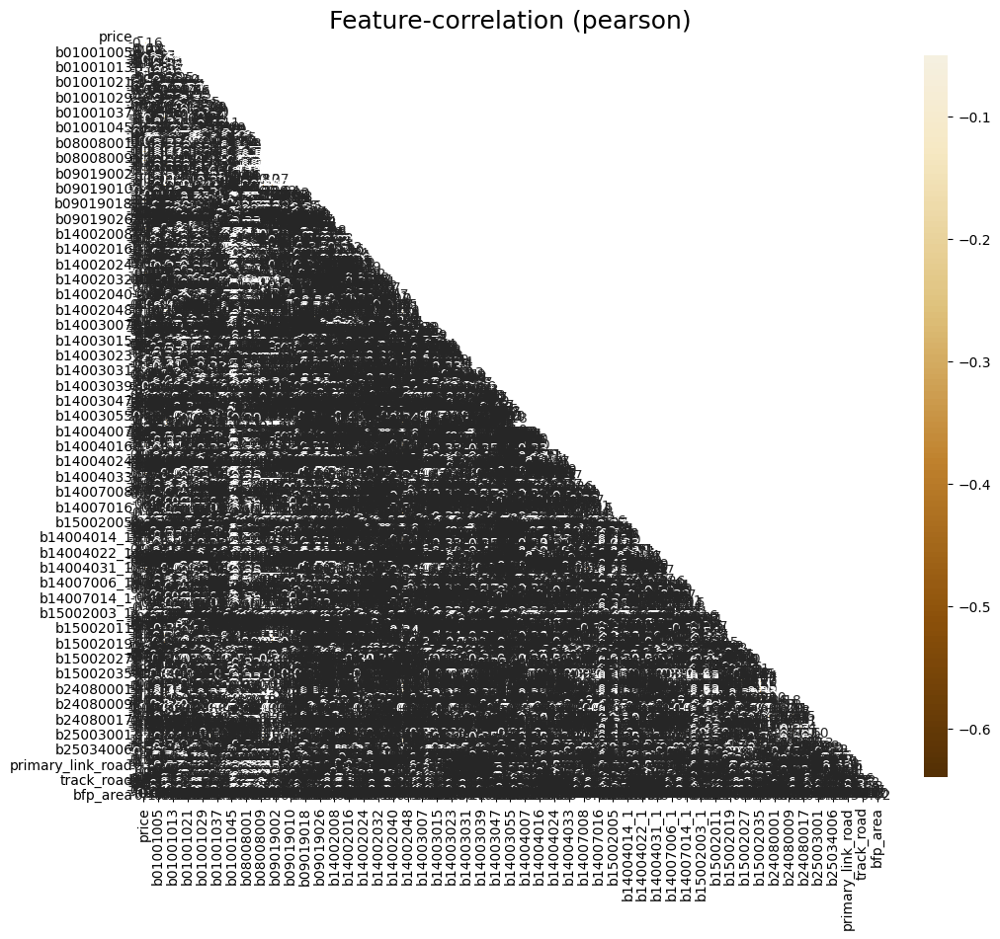

In [8]:
klib.corr_plot(data_cleaned, split='pos') # displaying only positive correlations, other settings include threshold, cmap...
klib.corr_plot(data_cleaned, split='neg') # displaying only negative correlations

<Axes: title={'center': 'Feature-correlation (pearson)'}>

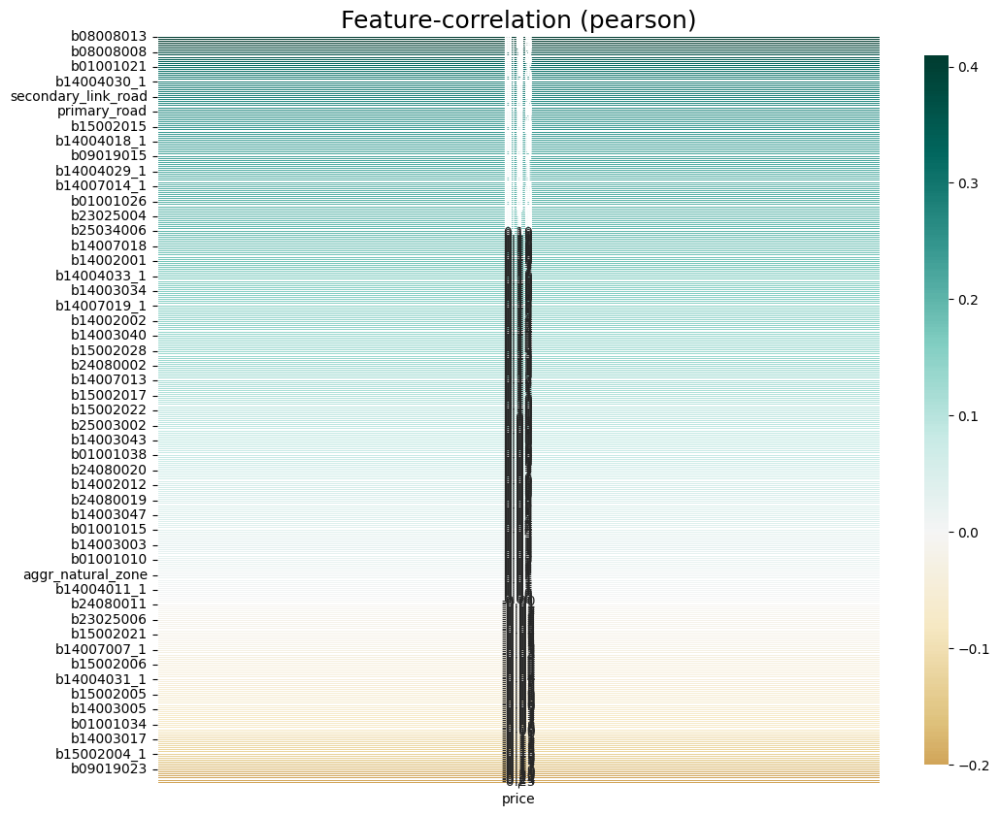

In [9]:
klib.corr_plot(data_cleaned, target='price') # default representation of correlations with the feature column


In [10]:
corr_matrix = klib.corr_mat(data) # default representation of a correlation matrix
corr_matrix

### Categorical Data Plot
The function allows to display the top and/or bottom values regarding their frequency in each column. Further, it gives an idea of the distribution of the values in the dataset. This plot comes in very handy during data analysis when considering changing datatypes to "category" or when planning to combine less frequent values into a seperate category before applying one-hot-encoding or similar functions.

GridSpec(6, 2)

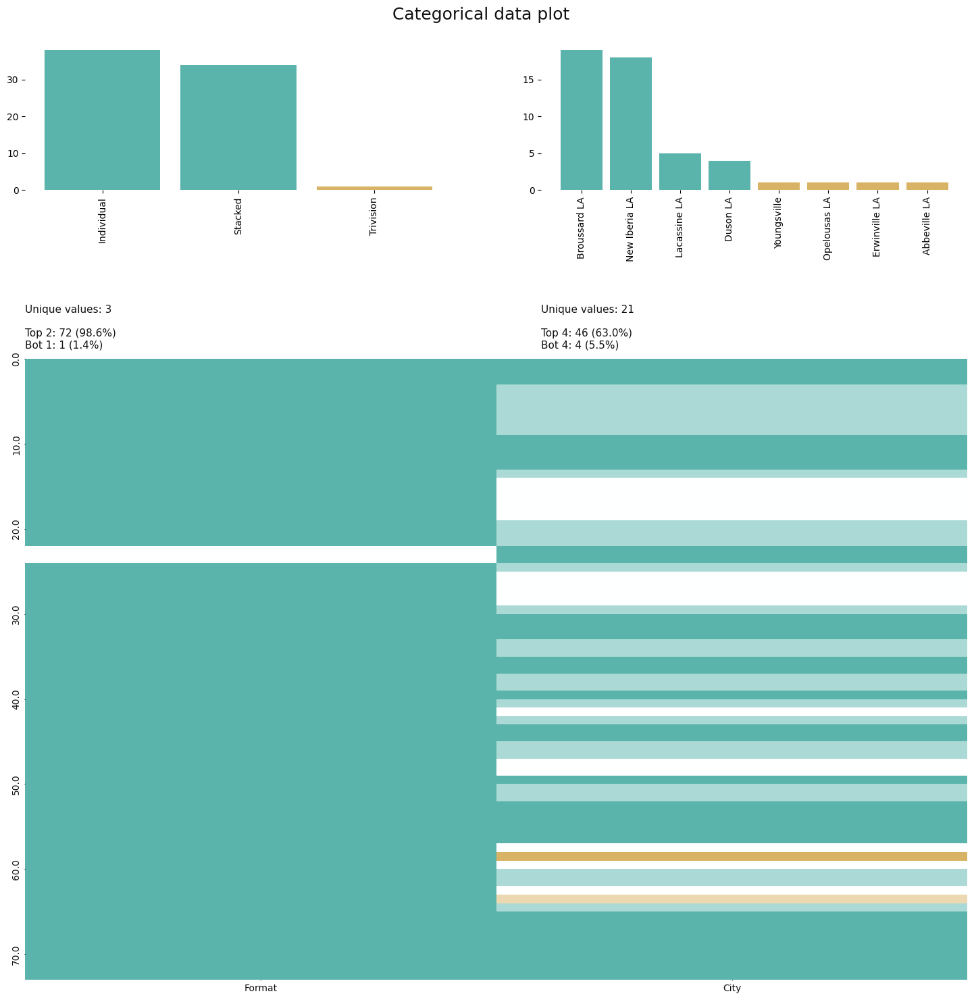

Bad pipe message: %s [b'y\xc2<\xb6\xb0\xd8\xbc\xe7\xdb\xef\xc8\x1f"\xfd\xd7{x\x90 s2\xb8U\x14\xf0\xb1n\xdb\xe9u-\xea\xa9\xf6\xffC*\xe0\xdddt\x12\xefm\x06\xe1:\xda(t\xe9\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01\x00']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 V\xb2\xdf|<\xcf\x83!^\xe6\x8b\x9f\x10\xcf\xf7\xd5\xd3\x0c,\xd2m\xa5']
Bad pipe message: %s [b'\xdaq/\x8b\xfcr\xb2o']
Bad pipe message: %s [b'\\r\xb8Xj\x0c\x12C\x114E_\xd4\xe1\x9b\x96\xe7\x93\x00\x00\xf4\xc00\xc0,\xc0(\xc0$\xc0\x14\xc0\n\x00\xa5\x00\xa3\x00\xa1\x00\x9f\x00k\x00j\x00i\x00h\x009\x008\x007\x006\x00']
Bad pipe message: %s [b"\xc1l\x16\x16f\xd7\x1b8e]\xf6\x

: 

In [11]:
klib.cat_plot(data, top=4, bottom=4) # representation of the 4 most & least common values in each categorical column